In [1]:
import os
import random
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset, Subset
from torchvision import models, transforms
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import time

In [2]:
# Define image path and model path
IMAGE_PATH = '/kaggle/input/enhanced-sharp'
# MODEL_PATH = '/kaggle/input/skripsi/pytorch/skripsi/1/model_epoch_16.pth'

In [3]:
# Custom Dataset Class
class KatherDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.images = []
        self.labels = []
        self.load_images()

    def load_images(self):
        categories = ['01_TUMOR', '02_STROMA', '03_COMPLEX', '04_LYMPHO', '05_DEBRIS', '06_MUCOSA', '07_ADIPOSE', '08_EMPTY']
        for label, category in enumerate(categories):
            category_path = os.path.join(self.image_dir, category)
            for image_name in os.listdir(category_path):
                image_path = os.path.join(category_path, image_name)
                self.images.append(image_path)
                self.labels.append(label)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        label = self.labels[idx]
        image = Image.open(image_path)
        if self.transform:
            image = self.transform(image)
        return image, label

In [4]:
# RESNET, DENSENET121
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [5]:
# Load the dataset
dataset = KatherDataset(IMAGE_PATH, transform=transform)

# Get the indices for the total dataset
indices = list(range(len(dataset)))

# Split the dataset: 88% for training + validation, 12% for testing
train_val_idx, test_idx = train_test_split(indices, test_size=0.12, stratify=dataset.labels)

# Inside the training set (88% of total), 15% is for validation
val_size = int(0.15 * len(train_val_idx))
train_idx, val_idx = train_test_split(train_val_idx, test_size=val_size, stratify=[dataset.labels[i] for i in train_val_idx])

In [6]:
# Create subsets for training, validation, and testing
train_dataset = Subset(dataset, train_idx)
val_dataset = Subset(dataset, val_idx)
test_dataset = Subset(dataset, test_idx)

# Create DataLoaders for training, validation, and testing datasets
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [7]:
class SelfAttention(nn.Module):
    def __init__(self, embed_size, heads):
        super(SelfAttention, self).__init__()
        self.embed_size = embed_size
        self.heads = heads
        self.head_dim = embed_size // heads

        assert (
            self.head_dim * heads == embed_size
        ), "Embedding size needs to be divisible by heads"

        self.values = nn.Linear(self.head_dim, self.head_dim, bias=False)
        self.keys = nn.Linear(self.head_dim, self.head_dim, bias=False)
        self.queries = nn.Linear(self.head_dim, self.head_dim, bias=False)
        self.fc_out = nn.Linear(heads * self.head_dim, embed_size)

    def forward(self, values, keys, query, mask=None):
        N = query.shape[0]
        value_len, key_len, query_len = values.shape[1], keys.shape[1], query.shape[1]

        # split embed self.heads diff pieces
        values = values.reshape(N, value_len, self.heads, self.head_dim)
        keys = keys.reshape(N, key_len, self.heads, self.head_dim)
        queries = query.reshape(N, query_len, self.heads, self.head_dim)

        values = self.values(values)
        keys = self.keys(keys)
        queries = self.queries(queries)
        
        # einstein sum --> computes the attention scores between q and k for each head across the batch.
        energy = torch.einsum("nqhd,nkhd->nhqk", [queries, keys])

        if mask is not None:
            energy = energy.masked_fill(mask == 0, float("-1e20"))

        # attention weights u/ each head & each query-key pair
        attention = torch.nn.functional.softmax(energy / (self.embed_size ** (1 / 2)), dim=3)

        out = torch.einsum("nhql,nlhd->nqhd", [attention, values]).reshape(
            N, query_len, self.heads * self.head_dim
        )

        out = self.fc_out(out)
        return out

In [8]:
# RESNET50

class HybridModel(nn.Module):
    def __init__(self, num_classes, embed_size, heads):
        super(HybridModel, self).__init__()
        self.cnn = models.resnet50()
        self.cnn.load_state_dict(torch.load('/kaggle/input/resnet50/pytorch/resnet/1/resnet50-0676ba61.pth'))
        
        # last conv layer
        self.cnn = nn.Sequential(*(list(self.cnn.children())[:-2]))  # Remove gap & fully connected layers
        
        self.conv1x1 = nn.Conv2d(2048, embed_size, kernel_size=1, stride=1)
        self.relu = nn.ReLU()

        self.self_attention = SelfAttention(embed_size, heads)

        self.classifier = nn.Sequential(
            nn.Linear(embed_size, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        features = self.cnn(x)
        features = self.conv1x1(features)
        features = self.relu(features)
        
        # unpack
        N, C, H, W = features.shape
        features = features.view(N, C, -1).permute(0, 2, 1)  # Reshape to (N, H*W, C)

        attn_output = self.self_attention(features, features, features)
        attn_output = attn_output.permute(0, 2, 1).view(N, C, H, W)  # Reshape back to (N, C, H, W)

        pooled_features = torch.nn.functional.adaptive_avg_pool2d(attn_output, (1, 1)).view(features.size(0), -1)  # Global pooling and flatten
        out = self.classifier(pooled_features)
        return out, features

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# def plot_confusion_matrix(conf_matrix, save_path=None):
#     plt.figure(figsize=(10, 8))
#     sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
#     plt.xlabel('Predicted Labels')
#     plt.ylabel('True Labels')
#     plt.title('Confusion Matrix')
#     if save_path:
#         plt.savefig(save_path)

def plot_confusion_matrix(conf_matrix, save_path=None):
    categories = ['01_TUMOR', '02_STROMA', '03_COMPLEX', '04_LYMPHO', '05_DEBRIS', '06_MUCOSA', '07_ADIPOSE', '08_EMPTY']
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    if save_path:
        plt.savefig(save_path)

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix

def train_model(model, train_loader, val_loader, num_epochs=10, learning_rate=0.001, save_dir='/kaggle/working'):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    
    history = {'train_loss': [], 'val_loss': [], 'train_accuracy': [], 'val_accuracy': []}
    
    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        train_correct = 0
        total_train = 0
        
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)
            
            optimizer.zero_grad()
            outputs, _ = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            train_correct += (predicted == labels).sum().item()
            total_train += labels.size(0)
        
        train_loss /= len(train_loader)
        train_accuracy = train_correct / total_train
        
        val_loss, val_accuracy, val_metrics = evaluate_model(model, val_loader, criterion, device)
        
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_accuracy'].append(train_accuracy)
        history['val_accuracy'].append(val_accuracy)
        
        print(f"Epoch {epoch+1}/{num_epochs}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
              f"Train Accuracy: {train_accuracy:.4f}, Val Accuracy: {val_accuracy:.4f}")
        print(f"Validation Metrics - Precision: {val_metrics['precision']:.4f}, Recall: {val_metrics['recall']:.4f}, "
              f"F1 Score: {val_metrics['f1_score']:.4f}, Error Rate: {val_metrics['error_rate']:.4f}")
        
        # Save the model at each epoch
        model_save_path = f'{save_dir}/model_epoch_{epoch+1}.pth'
        torch.save(model.state_dict(), model_save_path)
        print(f"Model saved to {model_save_path}")
        
        # Plot and save the confusion matrix
        plot_confusion_matrix(val_metrics['confusion_matrix'], save_path=f'{save_dir}/confusion_matrix_epoch_{epoch+1}.png')
    
    return history

In [11]:
def evaluate_model(model, val_loader, criterion, device):
    model.eval()
    val_loss = 0.0
    val_correct = 0
    total_val = 0
    
    all_labels = []
    all_predictions = []
    
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs, _ = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            
            _, predicted = torch.max(outputs, 1)
            val_correct += (predicted == labels).sum().item()
            total_val += labels.size(0)
            
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())
    
    val_loss /= len(val_loader)
    val_accuracy = val_correct / total_val
    
    precision = precision_score(all_labels, all_predictions, average='macro')
    recall = recall_score(all_labels, all_predictions, average='macro')
    f1 = f1_score(all_labels, all_predictions, average='macro')
    error_rate = 1 - accuracy_score(all_labels, all_predictions)
    # Handle the confusion matrix for multi-class classification
    conf_matrix = confusion_matrix(all_labels, all_predictions)
#     fdr = fp / (fp + tp)
    
    metrics = {
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'error_rate': error_rate,
        'confusion_matrix': conf_matrix
#         'fdr': fdr
    }
    
    return val_loss, val_accuracy, metrics

Epoch 1/200, Train Loss: 1.0336, Val Loss: 0.3838, Train Accuracy: 0.6936, Val Accuracy: 0.8894
Validation Metrics - Precision: 0.8984, Recall: 0.8893, F1 Score: 0.8902, Error Rate: 0.1106
Model saved to /kaggle/working/model_epoch_1.pth
Epoch 2/200, Train Loss: 0.3811, Val Loss: 0.2337, Train Accuracy: 0.8930, Val Accuracy: 0.9273
Validation Metrics - Precision: 0.9319, Recall: 0.9273, F1 Score: 0.9280, Error Rate: 0.0727
Model saved to /kaggle/working/model_epoch_2.pth
Epoch 3/200, Train Loss: 0.2299, Val Loss: 0.2475, Train Accuracy: 0.9326, Val Accuracy: 0.9227
Validation Metrics - Precision: 0.9253, Recall: 0.9229, F1 Score: 0.9228, Error Rate: 0.0773
Model saved to /kaggle/working/model_epoch_3.pth
Epoch 4/200, Train Loss: 0.1542, Val Loss: 0.2538, Train Accuracy: 0.9564, Val Accuracy: 0.9212
Validation Metrics - Precision: 0.9277, Recall: 0.9210, F1 Score: 0.9188, Error Rate: 0.0788
Model saved to /kaggle/working/model_epoch_4.pth
Epoch 5/200, Train Loss: 0.1411, Val Loss: 0.208

/tmp/ipykernel_34/2763470156.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10, 8))


Epoch 22/200, Train Loss: 0.0305, Val Loss: 0.2435, Train Accuracy: 0.9928, Val Accuracy: 0.9318
Validation Metrics - Precision: 0.9346, Recall: 0.9317, F1 Score: 0.9314, Error Rate: 0.0682
Model saved to /kaggle/working/model_epoch_22.pth
Epoch 23/200, Train Loss: 0.0220, Val Loss: 0.2744, Train Accuracy: 0.9936, Val Accuracy: 0.9348
Validation Metrics - Precision: 0.9374, Recall: 0.9347, F1 Score: 0.9348, Error Rate: 0.0652
Model saved to /kaggle/working/model_epoch_23.pth
Epoch 24/200, Train Loss: 0.0090, Val Loss: 0.2778, Train Accuracy: 0.9976, Val Accuracy: 0.9258
Validation Metrics - Precision: 0.9298, Recall: 0.9259, F1 Score: 0.9260, Error Rate: 0.0742
Model saved to /kaggle/working/model_epoch_24.pth
Epoch 25/200, Train Loss: 0.0350, Val Loss: 0.3036, Train Accuracy: 0.9912, Val Accuracy: 0.9303
Validation Metrics - Precision: 0.9349, Recall: 0.9304, F1 Score: 0.9310, Error Rate: 0.0697
Model saved to /kaggle/working/model_epoch_25.pth
Epoch 26/200, Train Loss: 0.0192, Val Lo

{'train_loss': [1.0336324674451454,
  0.38106935961633664,
  0.22992813036355197,
  0.15419578014148605,
  0.1410504064689844,
  0.09900702309046482,
  0.11598962070977586,
  0.08086968692513104,
  0.09421646341872521,
  0.07026110566818179,
  0.07326666169608824,
  0.03962608722126127,
  0.05718479064814587,
  0.04354238637094187,
  0.04191901486737128,
  0.022315519074332286,
  0.025924316267622236,
  0.06713419790980685,
  0.05175192863978923,
  0.03707556619157649,
  0.056806826402092926,
  0.03047586010538169,
  0.022040984341347367,
  0.009035649153445728,
  0.03498716112106848,
  0.019178417131317675,
  0.019372397195572693,
  0.020140711379806615,
  0.03750998362723209,
  0.01381746719953998,
  0.012054761042298539,
  0.026036698754745513,
  0.03611367661232312,
  0.017051891286948968,
  0.0291932556502328,
  0.03220928190340702,
  0.028708910555867318,
  0.021875451133102894,
  0.03274700038421612,
  0.011436289987209925,
  0.018940784047622908,
  0.024315595851826053,
  0.025

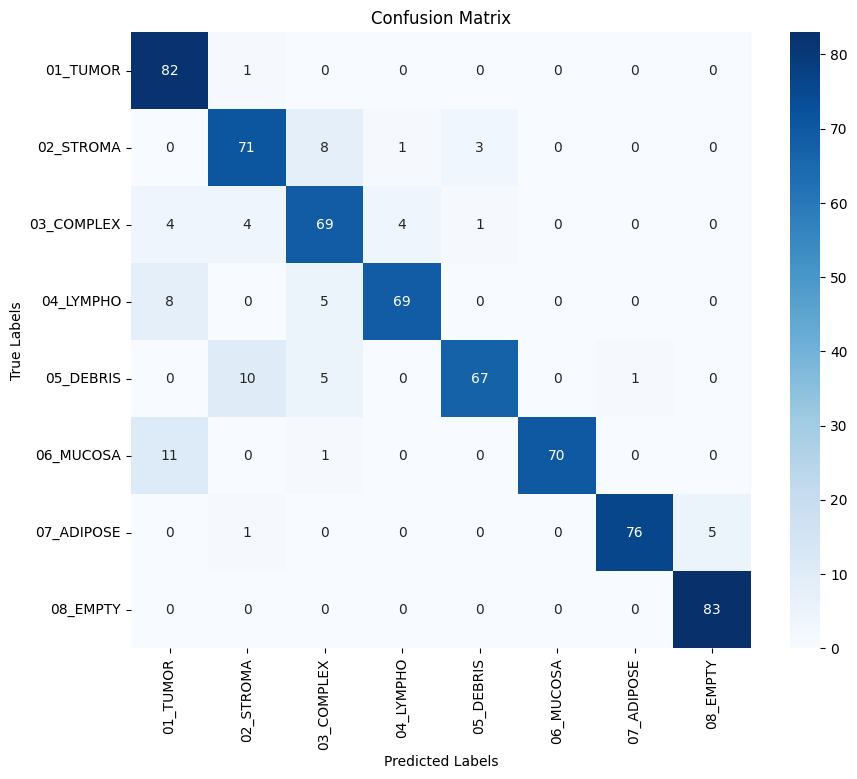

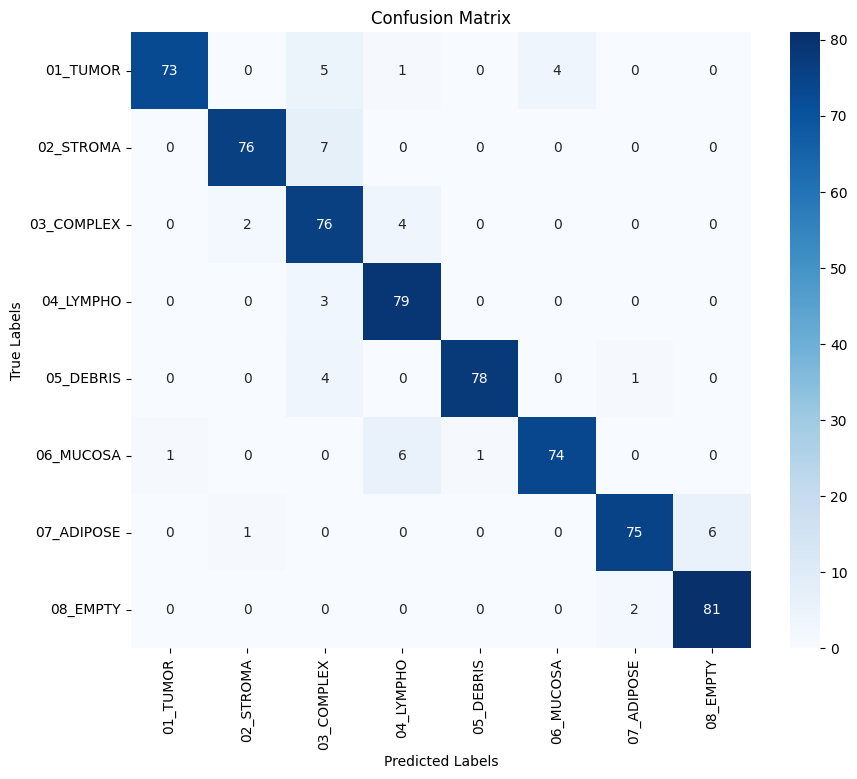

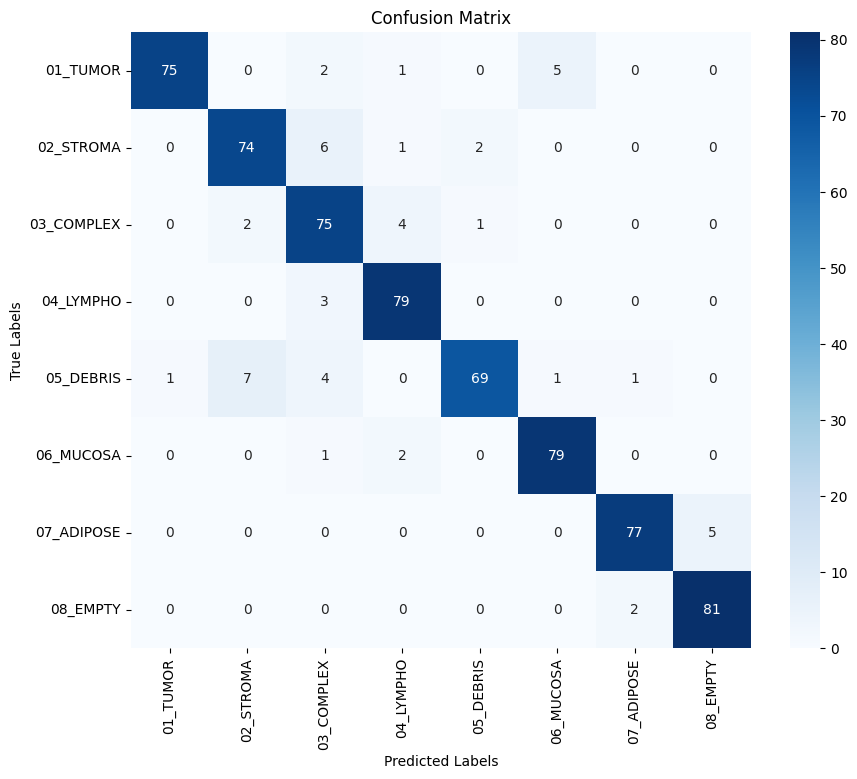

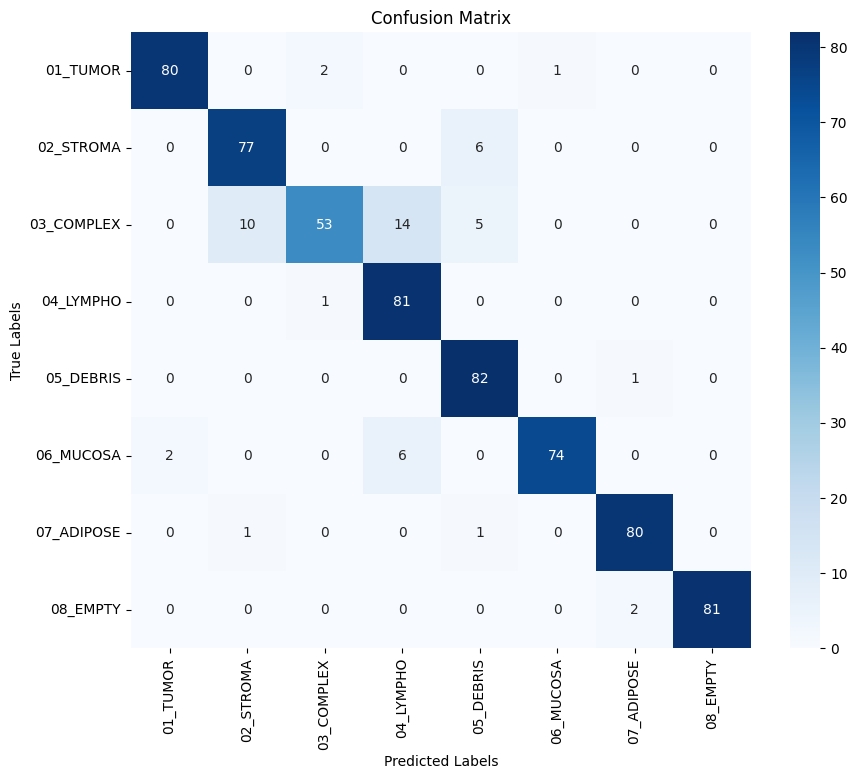

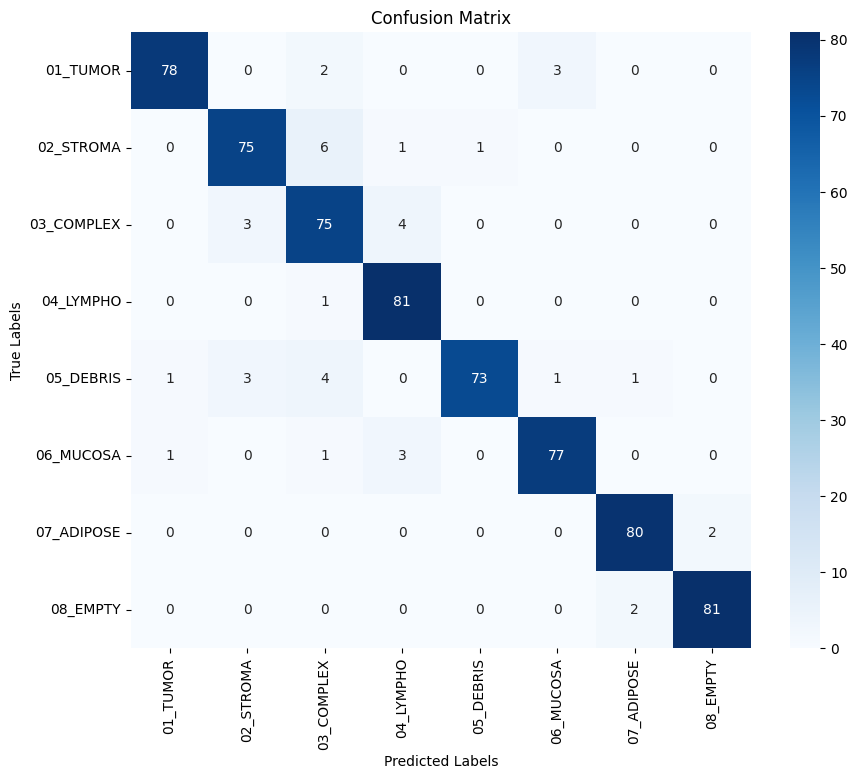

...

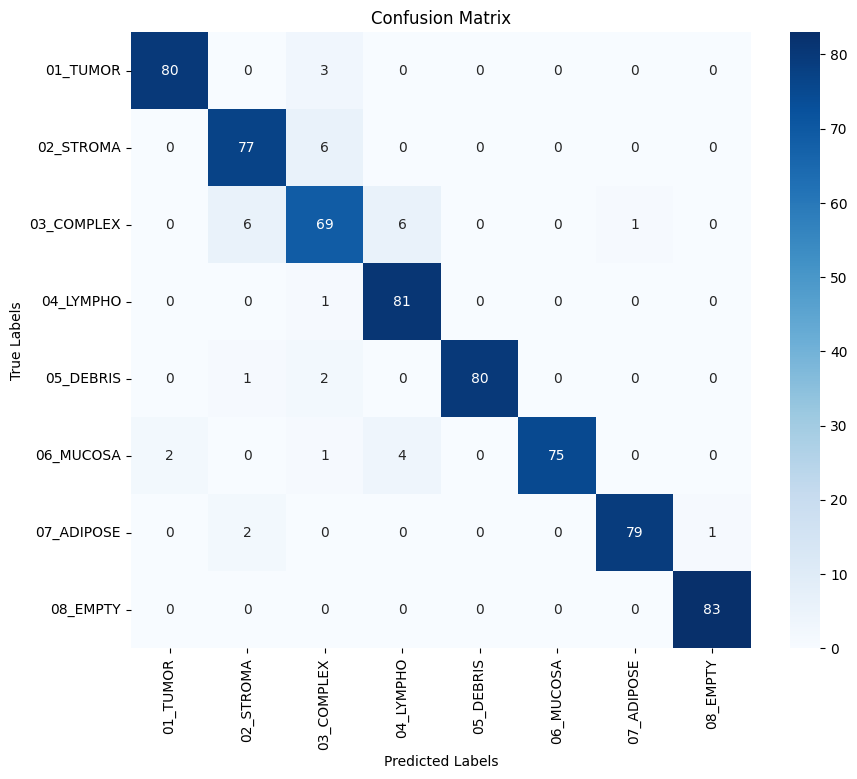

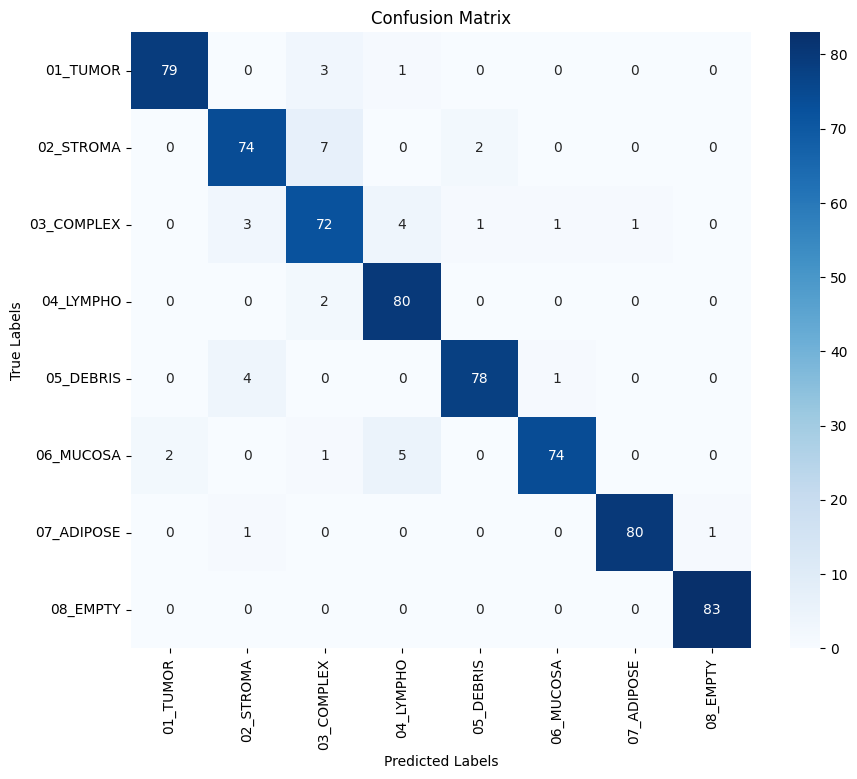

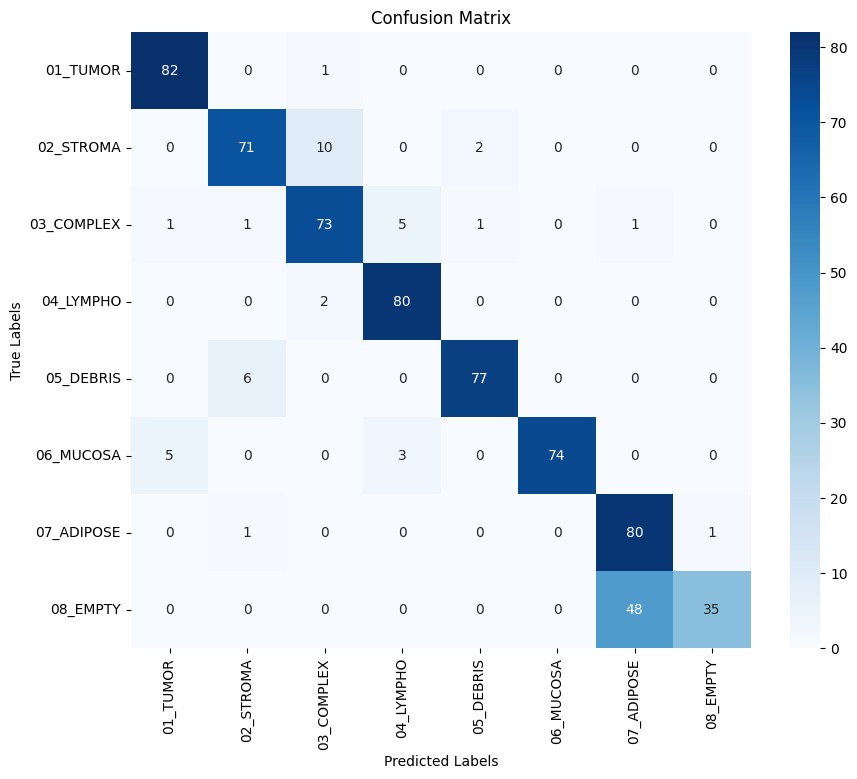

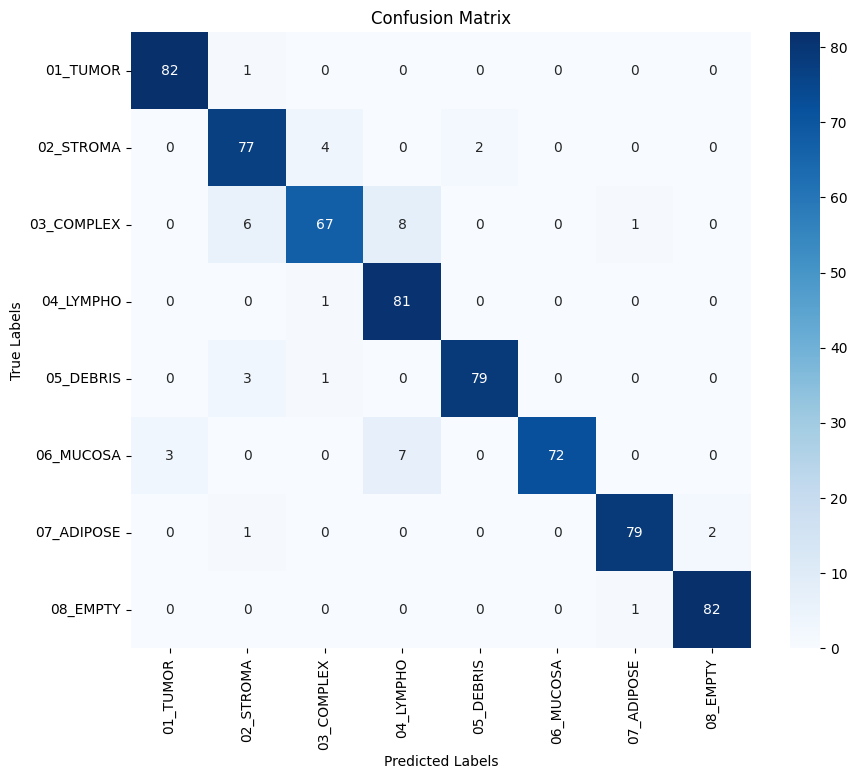

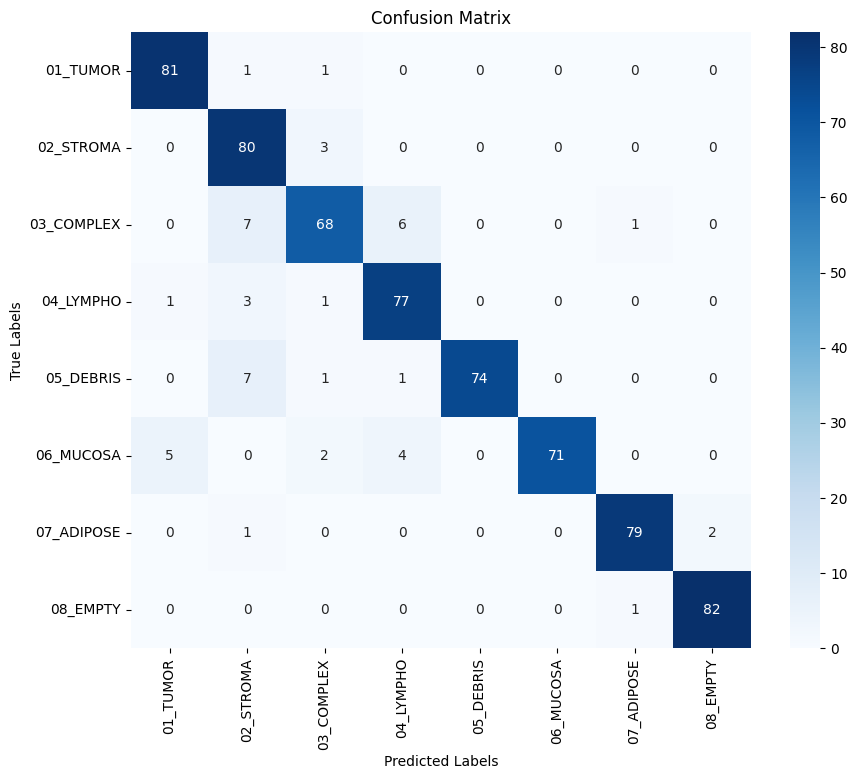

In [12]:
num_epochs = 200
learning_rate = 0.0001
embed_size = 64  # Ex
heads = 8  # Ex

model = HybridModel(num_classes=8, embed_size=embed_size, heads=heads)
train_model(model, train_loader, val_loader, num_epochs=num_epochs, learning_rate=learning_rate)

In [13]:
MODEL_PATH = '/kaggle/working/model_epoch_45.pth'

model = HybridModel(num_classes=8, embed_size=64, heads=8)
model.load_state_dict(torch.load(MODEL_PATH, map_location=torch.device('cuda' if torch.cuda.is_available() else 'cpu')))
model.eval()

HybridModel(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 

In [14]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

HybridModel(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 

In [15]:
# Evaluate the model and calculate the confusion matrix
all_labels = []
all_predictions = []
start_time = time.time()

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs, _ = model(images)  # unpack the tuple
        _, predicted = torch.max(outputs, 1)
        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())

end_time = time.time()
testing_time = end_time - start_time

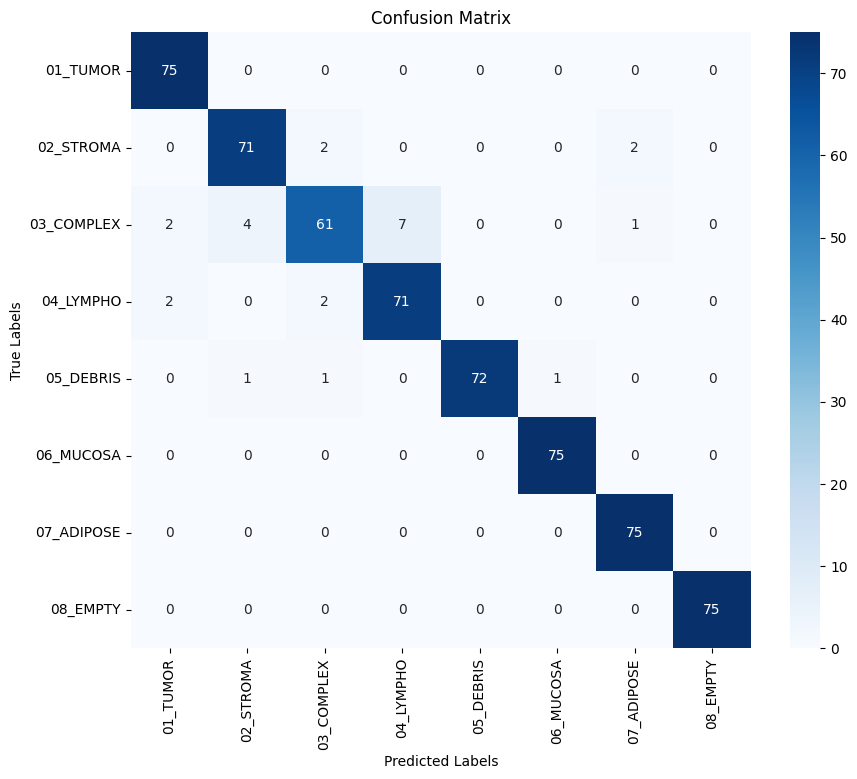

In [16]:
# Calculate the confusion matrix
conf_matrix = confusion_matrix(all_labels, all_predictions)

# Define category names
categories = ['01_TUMOR', '02_STROMA', '03_COMPLEX', '04_LYMPHO', '05_DEBRIS', '06_MUCOSA', '07_ADIPOSE', '08_EMPTY']

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [17]:
print(f"Testing Time: {testing_time:.2f} seconds")

Testing Time: 6.25 seconds
